# Data Assessment & Analytics - Regulatory Data
Notes:
- change os directory location
- be aware of the number of provdied native source data files

In [1]:
# Needed Libraries / Modules

# ---- working with data ----
import os  # native operating system interaction
import numpy as np  # mathematical array manipulation
import pandas as pd  # data structure and data analysis
import geopandas as gpd  # geo-data structure and data analysis

# ---- visualization ----
import geoplot as gplt  # for plotting maps and geo-data
import geoplot.crs as gcrs  #used to pull in webdata related to maps and geo-data
import missingno as msno # creates a matrix chart to show missing values
import plotly.express as px
import plotly.graph_objects as go  # for subplot creation
from plotly.subplots import make_subplots  # for subplot creation
import matplotlib.pyplot as mplt  # use with gplt to save fig to pdf

# ---- cleanup ----
import re # string regular expression manipulation
from datetime import datetime # date and time manipulation
pd.set_option('display.max_columns', 999)  # How to display all columns of a Pandas DataFrame in Jupyter Notebook
pd.set_option('display.float_format', lambda x: '%.5f' % x) # suppress scientific notation in Pandas

In [2]:
# ---- working directory ----
workingDirString = os.getcwd()
os.chdir(workingDirString)
print(f'The working Directory is:', workingDirString)

The working Directory is: C:\Users\rjame\Documents\WSWC Documents\MappingStatesDataToWaDE2.0\Oregon\Regulatory


In [3]:
# ---- where to find input files ----
InputFolderString = "G:/Shared drives/WaDE Data/Oregon/Regulatory"  # set this to where input files are located

In [4]:
# Native Input Data
#################################################################
# ---- This needs to be custom per state ----

# Data Set 1: oregon-water-resources-department-owrd-administrative-basins
dfin1 = pd.read_csv(InputFolderString + '/RawinputData/oregon-water-resources-department-owrd-administrative-basins.zip') # will need name of souce input files

In [5]:
# WaDE Processed Input Data
#################################################################

dfru = pd.read_csv(InputFolderString + "/ProcessedInputData/reportingunits.csv").replace(np.nan, "")
dfrupurge = pd.read_csv(InputFolderString + "/ProcessedInputData/reportingunits_missing.csv").replace(np.nan, "")

dfro = pd.read_csv(InputFolderString + "/ProcessedInputData/regulatoryoverlays.csv").replace(np.nan, "")
dfropurge = pd.read_csv(InputFolderString + "/ProcessedInputData/regulatoryoverlays_missing.csv").replace(np.nan, "")

dfs = pd.read_csv(InputFolderString + "/ProcessedInputData/sites.csv").replace(np.nan, "")

C:\Users\rjame\AppData\Local\Temp\ipykernel_13068\1979819206.py:10: DtypeWarning: Columns (1,7) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs = pd.read_csv(InputFolderString + "/ProcessedInputData/sites.csv").replace(np.nan, "")


# Reporting Unit Info
- reportingunits.csv

In [6]:
print(len(dfru))
dfru.head(1)

18


,ReportingUnitUUID,EPSGCodeCV,ReportingUnitName,ReportingUnitNativeID,ReportingUnitProductVersion,ReportingUnitTypeCV,ReportingUnitUpdateDate,StateCV,Geometry
0,ORre_RUor1,4326,North Coast,or1,9.60000,Administrative Basins,9/22/2021,OR,POLYGON ((-123.50593382709745 46.2351311106205...


<Axes: >

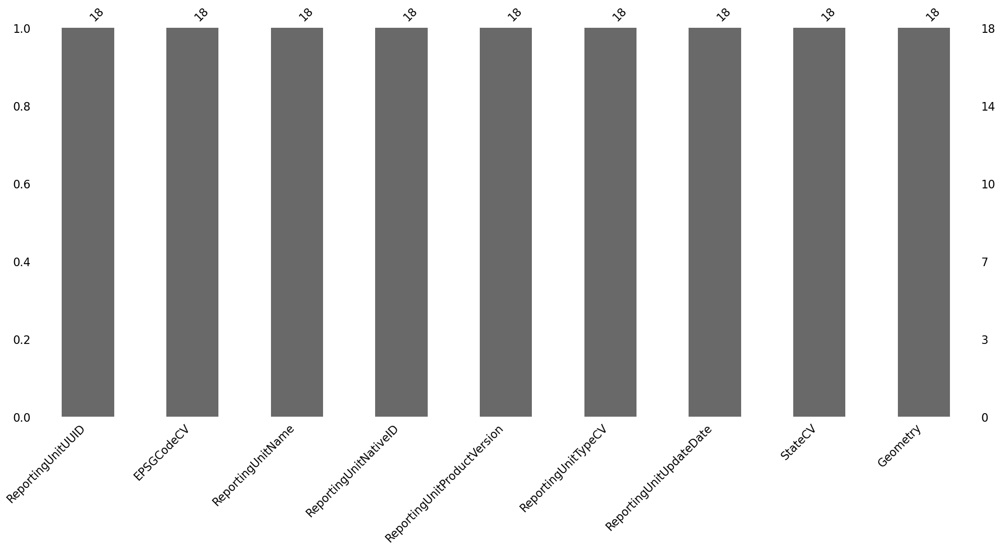

In [7]:
# Check what columns contain missing information.
#msno.matrix(dfru, figsize=(10,5), fontsize=10)
msno.bar(dfru)

In [8]:
# Unique values for 'ReportingUnitName'
for x in dfru['ReportingUnitName'].sort_values().unique():
    print(f'"' + x + '",')

"Deschutes",
"Goose & Summer Lakes",
"Grande Ronde",
"Hood",
"John Day",
"Klamath",
"Malheur",
"Malheur Lake",
"Mid Coast",
"North Coast",
"Owyhee",
"Powder",
"Rogue",
"Sandy",
"South Coast",
"Umatilla",
"Umpqua",
"Willamette",


In [9]:
# Unique values for 'ReportingUnitNativeID'
for x in dfru['ReportingUnitNativeID'].astype(str).sort_values().unique():
    print(f'"' + x + '",')

"or1",
"or10",
"or11",
"or12",
"or13",
"or14",
"or15",
"or16",
"or17",
"or18",
"or2",
"or3",
"or4",
"or5",
"or6",
"or7",
"or8",
"or9",


In [10]:
# Unique values for 'ReportingUnitTypeCV'
for x in dfru['ReportingUnitTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"Administrative Basins",


# Regulatory Overlay Info
- regulatoryoverlays.csv

In [11]:
print(len(dfro))
dfro.head(1)

18


,RegulatoryOverlayUUID,OversightAgency,RegulatoryDescription,RegulatoryName,RegulatoryOverlayNativeID,RegulatoryStatusCV,RegulatoryStatute,RegulatoryStatuteLink,StatutoryEffectiveDate,StatutoryEndDate,RegulatoryOverlayTypeCV,WaterSourceTypeCV
0,ORre_ROor5,Oregon Water Resources Department,Administrative rules which establish water man...,Deschutes,or5,Active,,,1993-10-07,,Administrative Basins,Surface and Groundwater


<Axes: >

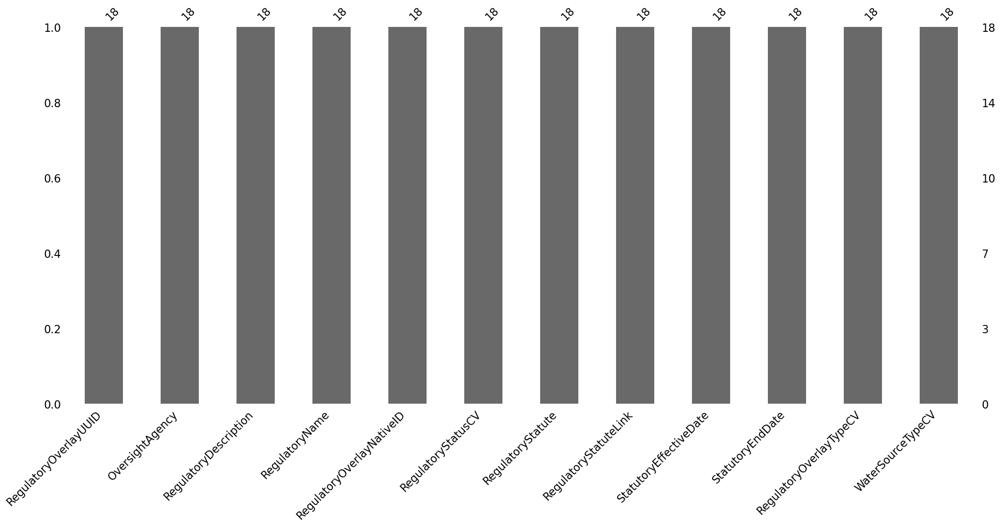

In [12]:
# Check what columns contain missing information.
#msno.matrix(dfro, figsize=(10,5), fontsize=10)
msno.bar(dfro)

In [13]:
# Unique values for 'OversightAgency'
for x in dfro['OversightAgency'].sort_values().unique():
    print(f'"' + x + '",')

"Oregon Water Resources Department",


In [14]:
# Unique values for 'RegulatoryName'
for x in dfro['RegulatoryName'].sort_values().unique():
    print(f'"' + x + '",')

"Deschutes",
"Goose & Summer Lakes",
"Grande Ronde",
"Hood",
"John Day",
"Klamath",
"Malheur",
"Malheur Lake",
"Mid Coast",
"North Coast",
"Owyhee",
"Powder",
"Rogue",
"Sandy",
"South Coast",
"Umatilla",
"Umpqua",
"Willamette",


In [15]:
# Unique values for 'RegulatoryOverlayNativeID'
for x in dfro['RegulatoryOverlayNativeID'].astype(str).sort_values().unique():
    print(f'"' + x + '",')

"or1",
"or10",
"or11",
"or12",
"or13",
"or14",
"or15",
"or16",
"or17",
"or18",
"or2",
"or3",
"or4",
"or5",
"or6",
"or7",
"or8",
"or9",


In [16]:
# Unique values for 'RegulatoryOverlayTypeCV'
for x in dfro['RegulatoryOverlayTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"Administrative Basins",


In [17]:
# Unique values for 'WaterSourceTypeCV'
for x in dfro['WaterSourceTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"Surface and Groundwater",


# Site Info (related to Overlays)
- sites.csv

In [18]:
print(len(dfs))
dfs.head(1)

193681


,SiteUUID,RegulatoryOverlayUUIDs,WaterSourceUUIDs,CoordinateAccuracy,CoordinateMethodCV,County,EPSGCodeCV,Geometry,GNISCodeCV,HUC12,HUC8,Latitude,Longitude,NHDNetworkStatusCV,NHDProductCV,PODorPOUSite,SiteName,SiteNativeID,SitePoint,SiteTypeCV,StateCV,USGSSiteID,WaterSourceUUID,WaterSourceTypeCV
0,ORwr_SPOD10000,ORre_ROor2,ORwr_WSwadeID315,WaDE Blank,WaDE Blank,WaDE Blank,4326,,,,,45.20715,-123.05841,,,POD,WaDE Blank,POD10000,,well,OR,,ORwr_WSwadeID315,Groundwater


## Num of Record Summary

In [19]:
print(f"Num of Source Entries (rows): ", len(dfin1))
print(f"Num of Identified Reporting Units: ", len(dfru))
print(f"Num of Identified Regulatory Overlays: ", len(dfro))

Num of Source Entries (rows):  19
Num of Identified Reporting Units:  18
Num of Identified Regulatory Overlays:  18


## Why Removed Records Summary

In [20]:
print("---- Reasons why records were removed from reporting unit source info ----")
if len(dfrupurge) != 0:
    print(dfrupurge['ReasonRemoved'].value_counts())
else:
    print("...nothing removed.")

---- Reasons why records were removed from reporting unit source info ----
...nothing removed.


In [21]:
print(" ---- Reasons why records were removed from regula toryoverlays info ---- ")
if len(dfropurge) != 0:
    print(dfropurge['ReasonRemoved'].value_counts())
else:
    print("...nothing removed.")

 ---- Reasons why records were removed from regula toryoverlays info ---- 
...nothing removed.


## Figures

ReportingUnitName
North Coast             1
Malheur                 1
Grande Ronde            1
Umatilla                1
John Day                1
Deschutes               1
Hood                    1
Sandy                   1
Willamette              1
Mid Coast               1
South Coast             1
Umpqua                  1
Rogue                   1
Klamath                 1
Goose & Summer Lakes    1
Malheur Lake            1
Owyhee                  1
Powder                  1
Name: count, dtype: int64


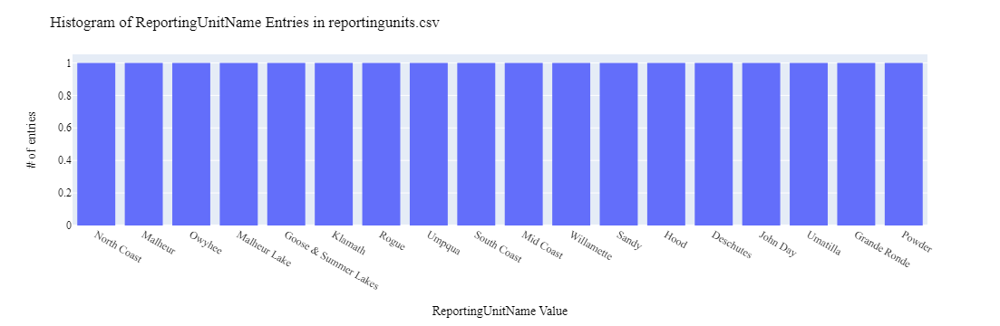

In [22]:
# ReportingUnitName: histogram distribution of WaDE values
print(dfru.ReportingUnitName.value_counts())

fig = px.histogram(dfru, x="ReportingUnitName")
fig.update_layout(bargap=0.2,
                  title="Histogram of ReportingUnitName Entries in reportingunits.csv",
                  xaxis_title="ReportingUnitName Value",
                  yaxis_title="# of entries",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/ReportingUnitName.png', engine="kaleido")

ReportingUnitTypeCV
Administrative Basins    18
Name: count, dtype: int64


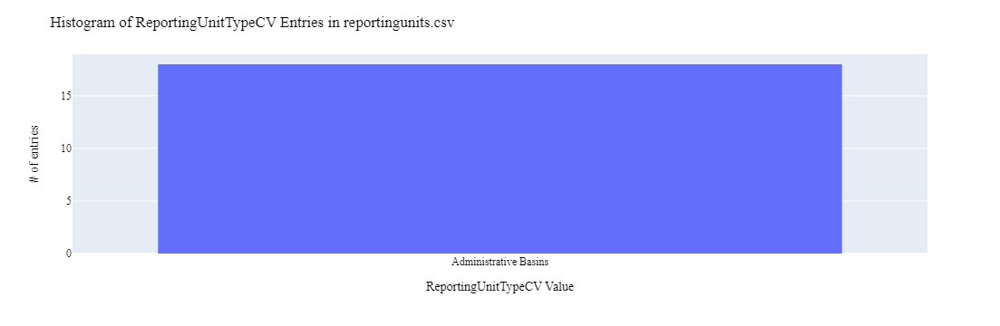

In [23]:
# ReportingUnitTypeCV: histogram distribution of WaDE values
print(dfru.ReportingUnitTypeCV.value_counts())

fig = px.histogram(dfru, x="ReportingUnitTypeCV")
fig.update_layout(bargap=0.2,
                  title="Histogram of ReportingUnitTypeCV Entries in reportingunits.csv",
                  xaxis_title="ReportingUnitTypeCV Value",
                  yaxis_title="# of entries",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/ReportingUnitTypeCV.png', engine="kaleido")

OversightAgency
Oregon Water Resources Department    18
Name: count, dtype: int64


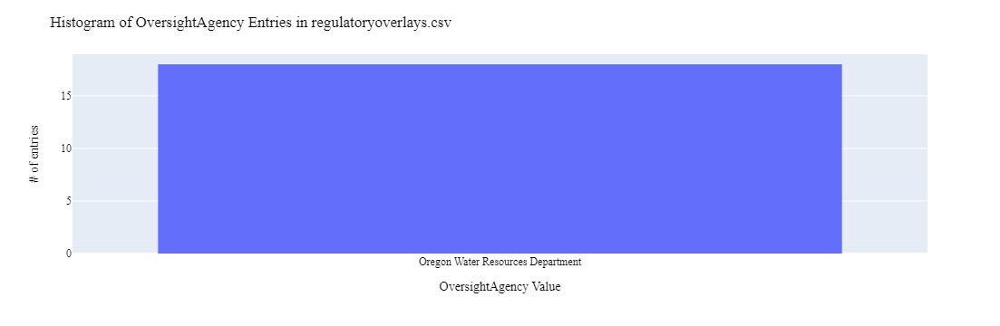

In [24]:
# OversightAgency: histogram distribution of WaDE values
print(dfro.OversightAgency.value_counts())

fig = px.histogram(dfro, x="OversightAgency")
fig.update_layout(bargap=0.2,
                  title="Histogram of OversightAgency Entries in regulatoryoverlays.csv",
                  xaxis_title="OversightAgency Value",
                  yaxis_title="# of entries",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/OversightAgency.png', engine="kaleido")

RegulatoryName
Deschutes               1
Goose & Summer Lakes    1
Umpqua                  1
Umatilla                1
South Coast             1
Sandy                   1
Rogue                   1
Powder                  1
Owyhee                  1
North Coast             1
Mid Coast               1
Malheur Lake            1
Malheur                 1
Klamath                 1
John Day                1
Hood                    1
Grande Ronde            1
Willamette              1
Name: count, dtype: int64


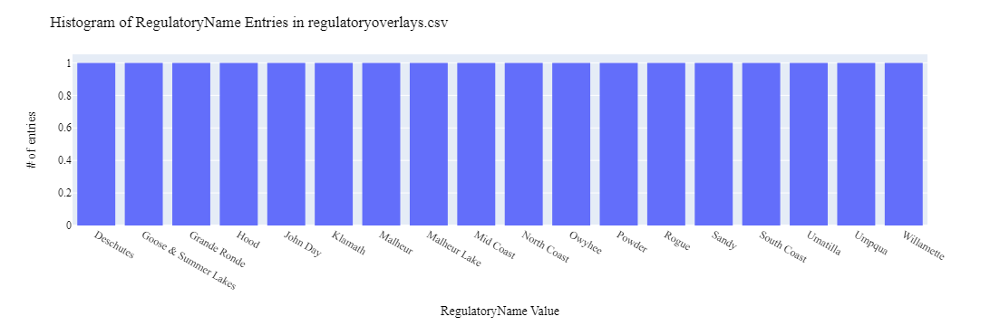

In [25]:
# RegulatoryName: histogram distribution of WaDE values
print(dfro.RegulatoryName.value_counts())

fig = px.histogram(dfro, x="RegulatoryName")
fig.update_layout(bargap=0.2,
                  title="Histogram of RegulatoryName Entries in regulatoryoverlays.csv",
                  xaxis_title="RegulatoryName Value",
                  yaxis_title="# of entries",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/RegulatoryName.png', engine="kaleido")

RegulatoryOverlayTypeCV
Administrative Basins    18
Name: count, dtype: int64


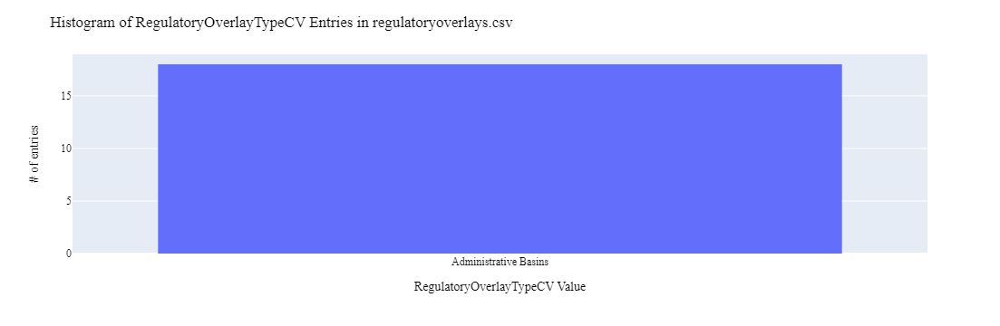

In [26]:
# RegulatoryOverlayTypeCV: histogram distribution of WaDE values
print(dfro.RegulatoryOverlayTypeCV.value_counts())

fig = px.histogram(dfro, x="RegulatoryOverlayTypeCV")
fig.update_layout(bargap=0.2,
                  title="Histogram of RegulatoryOverlayTypeCV Entries in regulatoryoverlays.csv",
                  xaxis_title="RegulatoryOverlayTypeCV Value",
                  yaxis_title="# of entries",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/RegulatoryOverlayTypeCV.png', engine="kaleido")

RegulatoryOverlayUUIDs
               114729
ORre_ROor2      27026
ORre_ROor15      8122
ORre_ROor16      5355
ORre_ROor7       4490
ORre_ROor6       4321
ORre_ROor12      3518
ORre_ROor5       3484
ORre_ROor8       3406
ORre_ROor9       3225
ORre_ROor10      2803
ORre_ROor13      2544
ORre_ROor18      2458
ORre_ROor14      2455
ORre_ROor1       2003
ORre_ROor4       1406
ORre_ROor11      1275
ORre_ROor3        566
ORre_ROor17       495
Name: count, dtype: int64


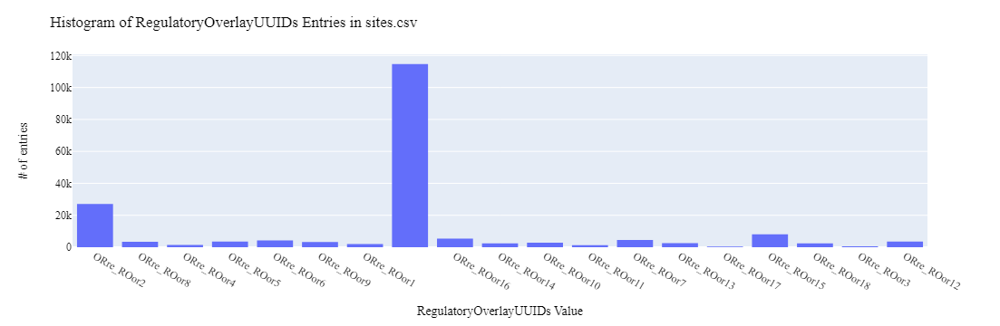

In [27]:
# RegulatoryOverlayUUIDs: histogram distribution of WaDE values
print(dfs.RegulatoryOverlayUUIDs.value_counts())

fig = px.histogram(dfs, x="RegulatoryOverlayUUIDs")
fig.update_layout(bargap=0.2,
                  title="Histogram of RegulatoryOverlayUUIDs Entries in sites.csv",
                  xaxis_title="RegulatoryOverlayUUIDs Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('figures/SiteRegulatoryOverlayUUIDs.png', engine="kaleido")

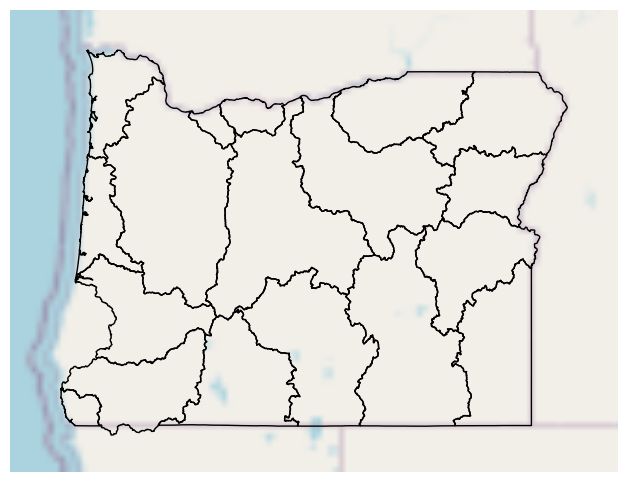

In [28]:
# Map poly info

dfruPoly = dfru.copy()
dfruPoly = dfruPoly[dfruPoly['Geometry'] != ""].reset_index(drop=True)

try:
    contiguous_usa = gpd.read_file(gplt.datasets.get_path('contiguous_usa')) # use for background map in subplot
    ax = gplt.webmap(contiguous_usa, projection=gcrs.WebMercator()) # set subplot

    dfruPoly['Geometry'] = gpd.GeoSeries.from_wkt(dfruPoly['Geometry'], crs="EPSG:4326")
    gdfruPoly = gpd.GeoDataFrame(dfruPoly, geometry=dfruPoly['Geometry'], crs="EPSG:4326") # covert to geodataframe
    #gdfruPoly['Geometry'] = gdfruPoly.simplify(0.001) # simplify the geometry. Lower the number the larger the exported file.
    gplt.polyplot(gdfruPoly, ax=ax)
    mplt.savefig(format="png", fname='figures/ReportingUnitMap.png') 
except:
    print('No geometry data to plot')

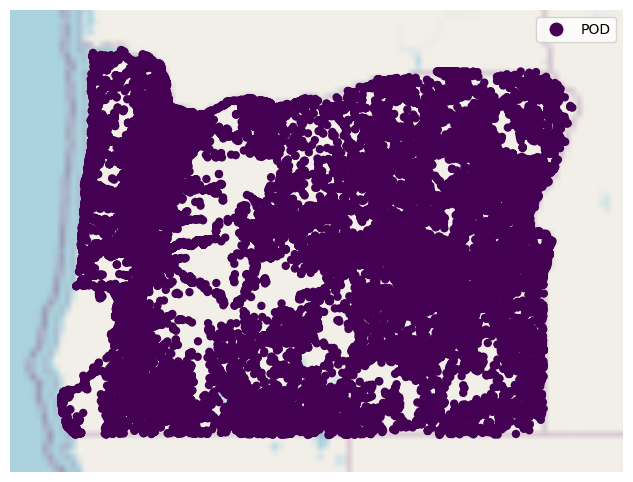

In [29]:
# map the site info (this would be lat & long Points only)

dfsPoint = dfs.copy()
dfsPoint = dfsPoint[dfsPoint['RegulatoryOverlayUUIDs'] != ""]
    
try:
    contiguous_usa = gpd.read_file(gplt.datasets.get_path('contiguous_usa')) # use for background map in subplot
    ax = gplt.webmap(contiguous_usa, projection=gcrs.WebMercator()) # set subplot
    
    gdfsPoint = gpd.GeoDataFrame(dfsPoint, geometry=gpd.points_from_xy(dfsPoint.Longitude.astype(float), dfsPoint.Latitude.astype(float)), crs="EPSG:4326")
    gplt.pointplot(gdfsPoint, hue='PODorPOUSite', legend=True, legend_var='hue', ax=ax)
    mplt.savefig(format="png", fname='figures/PointInRegMap.png') 
    
except:
    print('No point data to plot')

# Custom Queries and Analysis for this Dataset

In [30]:
# asdf